In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torchvision as tv
from PIL import Image
from pytorch_lightning import Trainer
from torch.nn import functional as F
from torchvision.utils import make_grid

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from dhdrnet.model import (
    DHDRMobileNet_v1,
    DHDRMobileNet_v2,
    DHDRMobileNet_v3,
    DHDRSimple,
    DHDRSqueezeNet,
)
from dhdrnet.util import DATA_DIR, ROOT_DIR

figdir = ROOT_DIR / "figures"
plt.rcParams["figure.figsize"] = (10, 10)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu") 
gpus = "0" if torch.cuda.is_available() else None

def show(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)), interpolation="nearest")
    plt.show()

In [3]:
from IPython.utils import io
def get_best_model(model_cls, backbone:str):
    
    with io.capture_output(stdout=True,stderr=True) as _captured:
        trainer = Trainer(gpus=gpus, progress_bar_refresh_rate=0)
        test_scores = dict()
        for ckpt in (ROOT_DIR / "checkpoints").glob(f"*{backbone}*"):
            model = model_cls.load_from_checkpoint(
                checkpoint_path=str(ckpt)
            )
            model.eval()

            test_score = trainer.test(model)["test_loss"]
            test_scores[str(ckpt.stem)] = test_score
    
    best_model = min(test_scores.items(),key=lambda x:x[1])
    return best_model, test_scores

In [4]:
best_mobilev1, mobile_v1_scores = get_best_model(DHDRMobileNet_v1, "mobile_v1")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [5]:
best_mobilev2, mobile_v2_scores = get_best_model(DHDRMobileNet_v2, "mobile_v2")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [6]:
best_mobilev3, mobile_v3_scores = get_best_model(DHDRMobileNet_v3, "mobile_v3")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [7]:
best_squeeze, squeeze_scores = get_best_model(DHDRSqueezeNet, "squeeze")

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
CUDA_VISIBLE_DEVICES: [0]


In [8]:
print(best_mobilev1)
print(best_mobilev2)
print(best_mobilev3)
print(best_squeeze)
best_model = DHDRMobileNet_v2.load_from_checkpoint(
    str(ROOT_DIR / "checkpoints" / f"{best_mobilev2[0]}.ckpt")
).to(device)

('dhdr_mobile_v1_final2020-07-25T16:29:20.164353', nan)
('mobile_v2dhdr-epoch=33-val_loss=1.36', 1.2294563055038452)
('mobile_v3dhdr-epoch=15-val_loss=1.50', 1.527131199836731)
('squeezedhdr-epoch=59-val_loss=1.60', 1.6680253744125366)


In [9]:
image_names = pd.read_csv(ROOT_DIR / "test.txt", header=None).sample(n=9)[0]

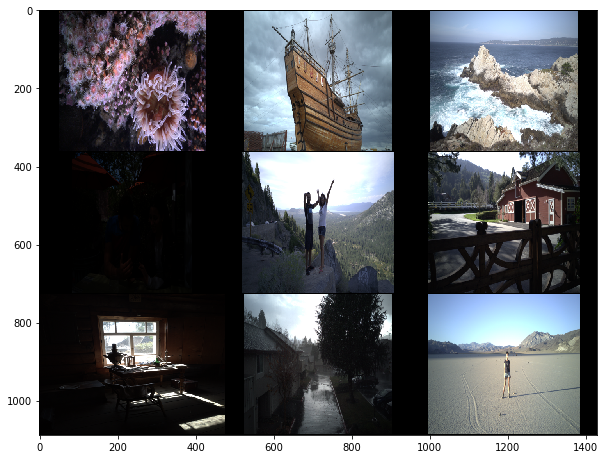

In [10]:
input_images = [
    Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")
    for name in image_names
]

transforms = tv.transforms.Compose(
    [
        tv.transforms.CenterCrop((360, 474)),  # min dimensions along DS
        tv.transforms.ToTensor(),
    ]
)
image_tensors = torch.stack([transforms(im) for im in input_images])
show(make_grid(image_tensors, nrow=3))

In [11]:
ev_options = np.arange(-3, 6.25, 0.25)

def get_preds(model, input):
    outputs = F.softmax(model(input.to(device)), dim=1)
    _, predictions = torch.max(outputs, 1)
    predictions = predictions.to("cpu")
    return predictions


predictions = get_preds(best_model, image_tensors)
print(f"{predictions=}")

predictions=tensor([26, 25, 25, 29, 24, 28, 28, 28, 22])


/home/shane/.cache/pypoetry/virtualenvs/dhdrnet-md5k9ngR-py3.8/lib/python3.8/site-packages/colour/utilities/verbose.py:235: ColourWarning: "Adobe DNG Converter" is not available on your platform!
  warn(*args, **kwargs)


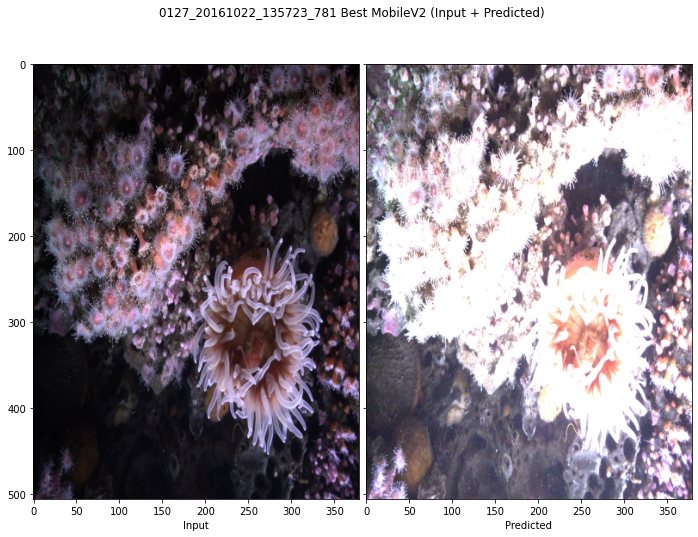

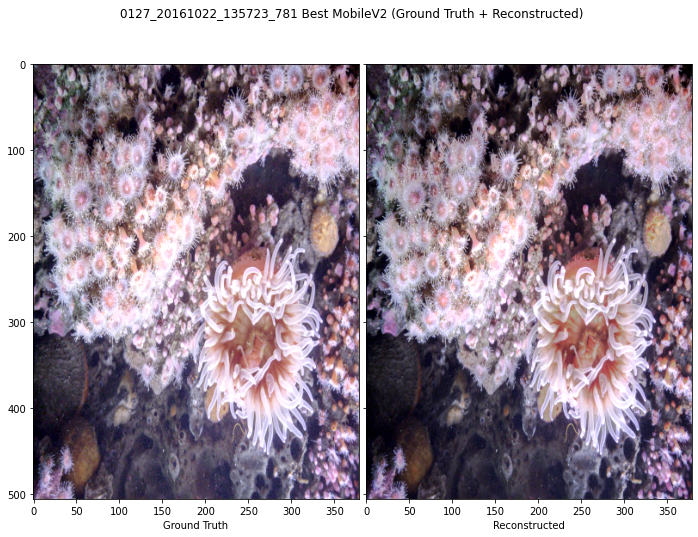

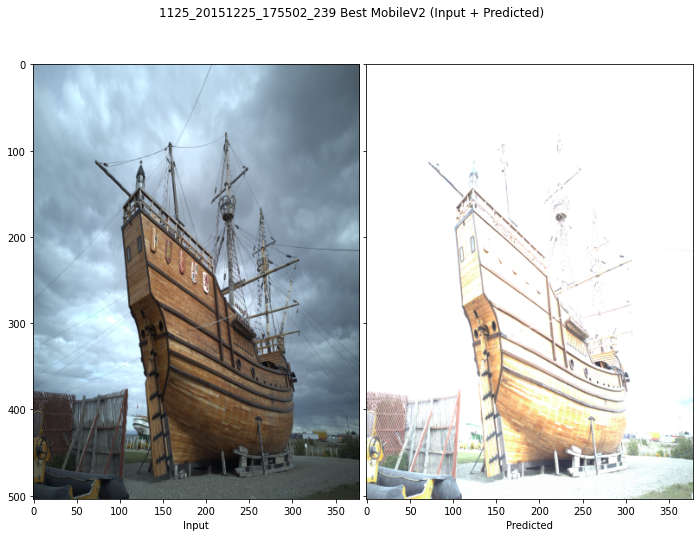

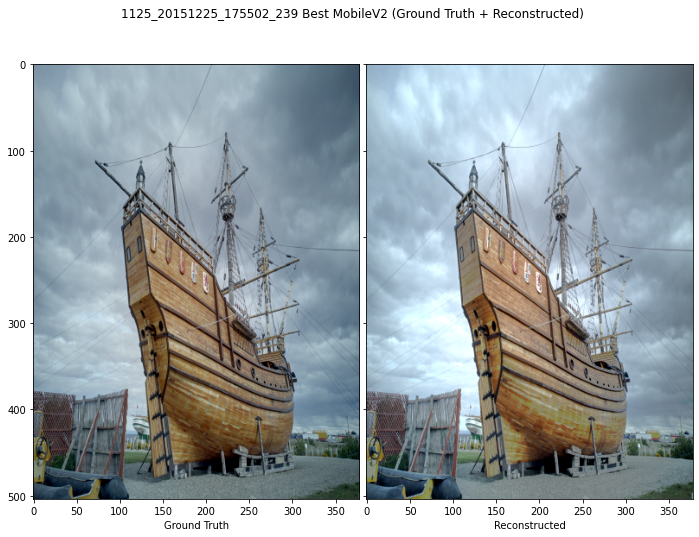

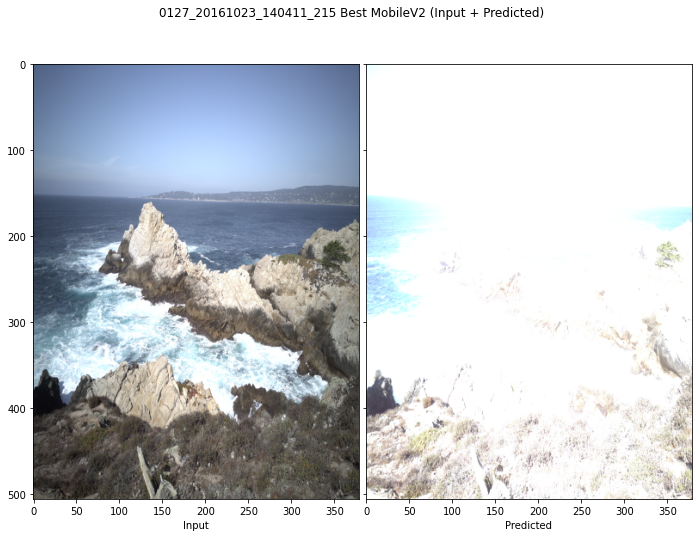

...

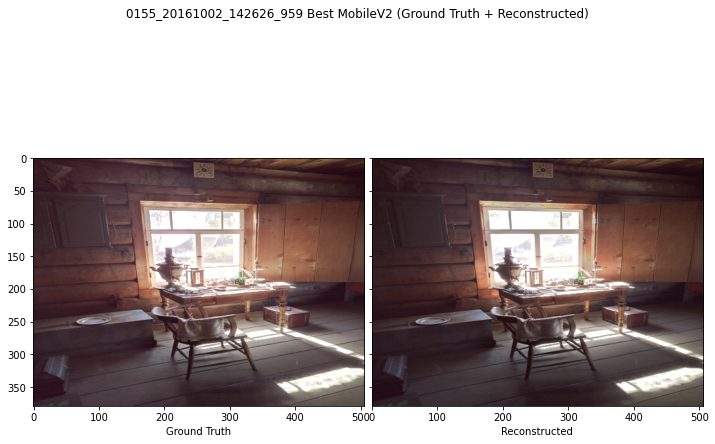

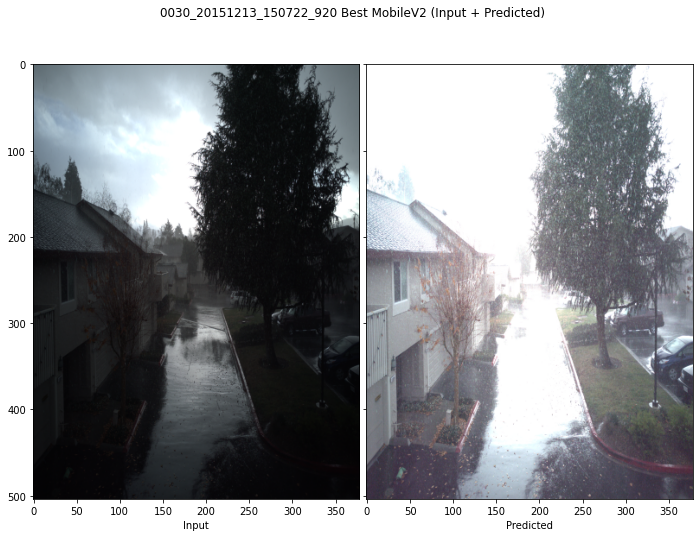

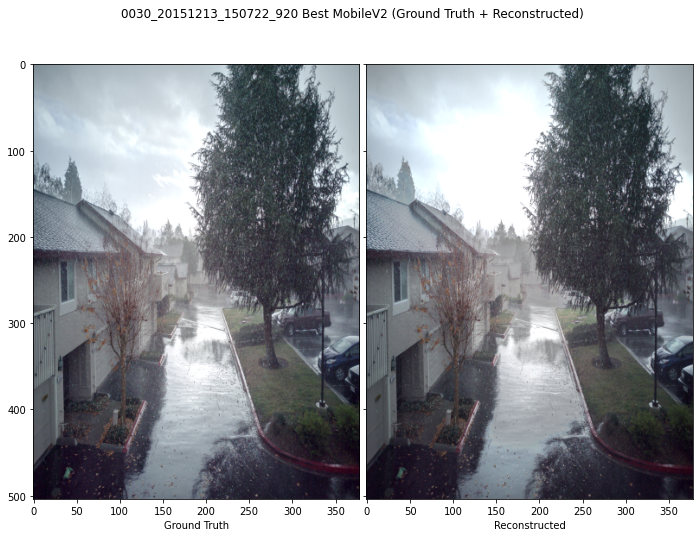

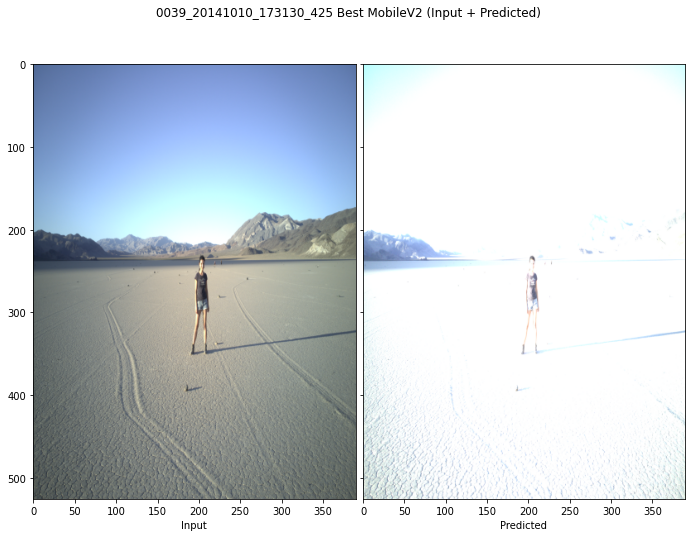

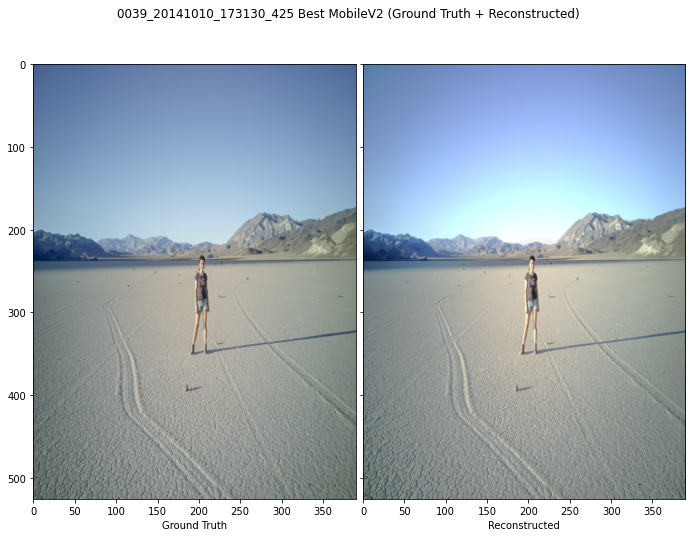

In [12]:
from dhdrnet.vis_util import show_image_pair, show_predictions

show_predictions(predictions, "Best MobileV2", image_names, ev_options)

In [13]:
from more_itertools import chunked, flatten


def load_image(name):
    return Image.open(DATA_DIR / "correct_exposures" / "exposures" / f"{name}[0.0].png")

test_names = [
    str(name_arr[0]) 
    for name_arr in pd.read_csv(
        ROOT_DIR / "precomputed_data" / "test_current.csv"
    ).to_numpy()
]

In [14]:
from torchvision.transforms import Compose, Resize, ToTensor

def predictions_by_name(img_name, model):
    name_preds = []
    for chunk in chunked(test_names, n=32):
        images = [load_image(im) for im in chunk]

        transform = Compose(
            [
                Resize((300, 300)),
                ToTensor(),
            ]
        )

        test_batch = torch.stack([transform(im) for im in images])
        predictions = get_preds(model, test_batch).numpy()
        name_preds.append(zip(chunk, predictions, (ev_options[p] for p in predictions)))

    name_preds = list(flatten(name_preds))
    return name_preds


df = pd.DataFrame.from_records(
    predictions_by_name(test_names, best_model),
    columns=["name", "pred_ev_index", "pred_ev"],
).set_index("name")
df

,pred_ev_index,pred_ev
name,,
0030_20151008_105249_589,28,4.00
5066_20160724_121618_110,9,-0.75
0037_20160719_125227_729,29,4.25
0543_20150918_175650_498,29,4.25
5a9e_20150404_131348_909,29,4.25
...,...,...
0543_20150918_072911_757,23,2.75
0043_20160908_100556_696,29,4.25
9bf4_20150824_204210_479,29,4.25


In [15]:
from dhdrnet.Dataset import LUTDataset

test_data = LUTDataset(
    df=pd.read_csv(ROOT_DIR / "precomputed_data" / "store_current.csv"),
    exposure_path=DATA_DIR / "correct_exposures" / "exposures",
    raw_dir=DATA_DIR / "dngs",
    name_list=ROOT_DIR / "precomputed_data" / "test_current.csv",
)

In [16]:
test_data.opt_choices

0006_20160721_170707_736    3.25
0006_20160721_175239_909    3.75
0006_20160721_181525_062    4.00
0006_20160722_100126_028    3.50
0006_20160722_100951_201    6.00
                            ... 
c483_20150901_173210_443   -0.75
c483_20150901_194029_165    3.75
c483_20150901_195108_436    3.00
c483_20150901_214630_530    3.00
c483_20150901_221141_886    3.50
Length: 724, dtype: float64

In [17]:
df["opt_ev"] = test_data.opt_choices
ev_df = df[["pred_ev", "opt_ev"]].copy()
ev_df

,pred_ev,opt_ev
name,,
0030_20151008_105249_589,4.00,4.25
5066_20160724_121618_110,-0.75,-0.50
0037_20160719_125227_729,4.25,4.50
0543_20150918_175650_498,4.25,4.50
5a9e_20150404_131348_909,4.25,4.50
...,...,...
0543_20150918_072911_757,2.75,2.50
0043_20160908_100556_696,4.25,4.50
9bf4_20150824_204210_479,4.25,4.75


<AxesSubplot:>

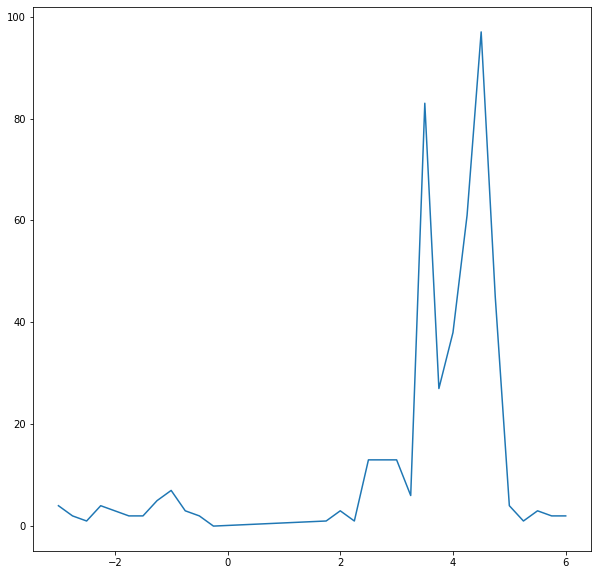

In [18]:
ev_counts = ev_df.apply(lambda s: s.value_counts()).fillna(0).astype(int)
diffs = ((ev_counts["pred_ev"] - ev_counts["opt_ev"])**2).transform(np.sqrt)
diffs.plot()

In [19]:
ev_df["pred_diff"] = abs(ev_df["opt_ev"] - ev_df["pred_ev"])
accuracy = len(ev_df[ev_df["pred_diff"] == 0]) / len(ev_df)
accuracy

0.22375690607734808

In [20]:
ev_df

,pred_ev,opt_ev,pred_diff
name,,,
0030_20151008_105249_589,4.00,4.25,0.25
5066_20160724_121618_110,-0.75,-0.50,0.25
0037_20160719_125227_729,4.25,4.50,0.25
0543_20150918_175650_498,4.25,4.50,0.25
5a9e_20150404_131348_909,4.25,4.50,0.25
...,...,...,...
0543_20150918_072911_757,2.75,2.50,0.25
0043_20160908_100556_696,4.25,4.50,0.25
9bf4_20150824_204210_479,4.25,4.75,0.50


In [21]:
len(ev_df[ev_df["pred_diff"] <= 0.50]) / len(ev_df)

0.8839779005524862

<AxesSubplot:title={'center':'% within N EV of Optimal'}, ylabel='EV'>

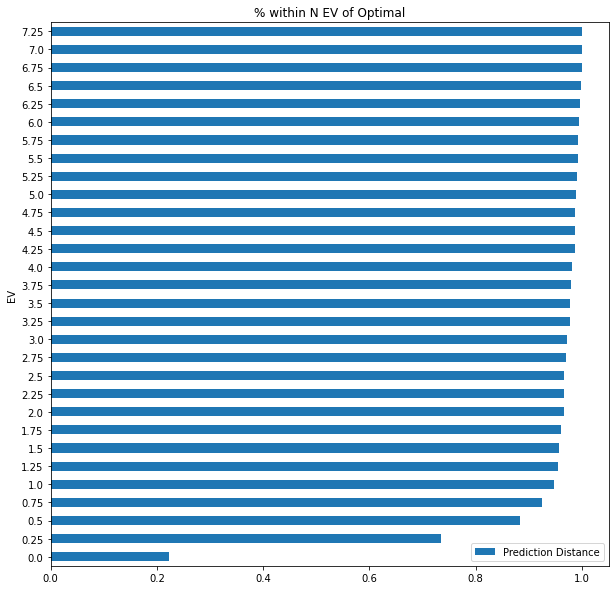

In [22]:
from dhdrnet.util import pred_distance

pred_thresh = pd.DataFrame.from_dict({ 
    thresh: pred_distance(thresh, ev_df, "opt_ev", "pred_ev") 
    for thresh in np.arange(0, 7.5, 0.25) 
}, orient="index",columns=["Prediction Distance"])
pred_thresh.index = pred_thresh.index.rename("EV")
pred_thresh.to_csv(ROOT_DIR/ "figures" / "pct_within.csv")
pred_thresh.sort_index().plot.barh(title="% within N EV of Optimal", legend=True)

In [23]:
pred_thresh

,Prediction Distance
EV,
0.00,0.223757
0.25,0.734807
0.50,0.883978
0.75,0.924033
1.00,0.947514
1.25,0.954420
1.50,0.957182
1.75,0.959945
2.00,0.965470


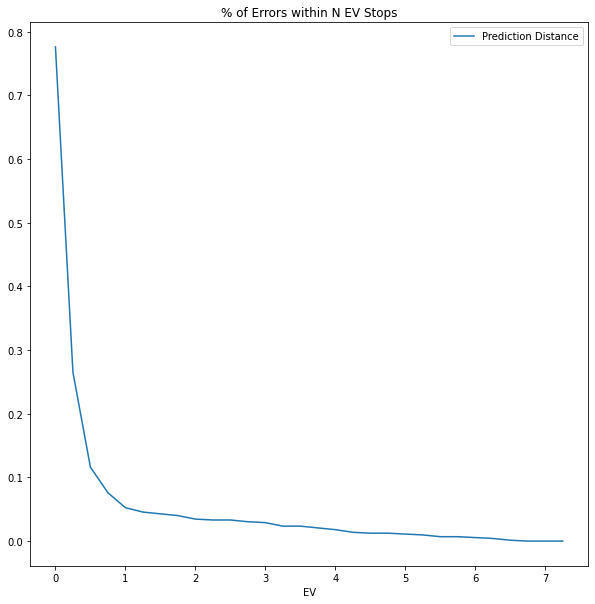

In [24]:
(1 - pred_thresh).plot(title="% of Errors within N EV Stops")
plt.savefig(figdir / "pct_err_within_n_ev_best_model.svg")

In [25]:
tdf = test_data.data
tdf

metric                            mse                                         \
ev                              -3.00        -2.75        -2.50        -2.25   
0006_20160721_170707_736  1564.444742  1620.747432  1666.827206  1694.827552   
0006_20160721_175239_909  4833.678364  4931.049788  5023.474798  5096.684604   
0006_20160721_181525_062  4030.755679  4099.319882  4154.594938  4191.564140   
0006_20160722_100126_028  3096.586446  3195.740610  3285.280822  3355.353795   
0006_20160722_100951_201   256.802163   291.744275   325.948450   357.335873   
...                               ...          ...          ...          ...   
c483_20150901_173210_443   396.788974   414.150080   424.499389   421.893856   
c483_20150901_194029_165  4089.551454  4099.503758  4076.524716  4038.705294   
c483_20150901_195108_436  3136.258062  3158.604146  3150.862320  3122.928498   
c483_20150901_214630_530  5143.751095  5265.341578  5354.983200  5412.049453   
c483_20150901_221141_886  7165.308185  7285.930914  7377.103449  7451.839310   

metric                                                                        \
ev                              -2.00        -1.75        -1.50        -1.25   
0006_20160721_170707_736  1703.434451  1598.156467  1594.859254  1543.512098   
0006_20160721_175239_909  5149.722950  5132.641241  5127.621899  5039.689928   
0006_20160721_181525_062  4196.336224  4112.124243  4107.827877  4003.839777   
0006_20160722_100126_028  3393.217263  3398.260426  3304.577579  3260.788758   
0006_20160722_100951_201   380.441056   381.866729   382.741421   353.604755   
...                               ...          ...          ...          ...   
c483_20150901_173210_443   407.417568   341.777813   338.061688   290.665286   
c483_20150901_194029_165  3962.634683  3856.468872  3444.100464  3442.939489   
c483_20150901_195108_436  3074.531499  2977.176778  2857.079921  2593.799426   
c483_20150901_214630_530  5419.047871  5384.352295  5297.645468  5154.911430   
c483_20150901_221141_886  7482.942462  7485.706860  7433.829155  7331.016986   

metric                                              ...      ssim            \
ev                              -1.00        -0.75  ...      3.75      4.00   
0006_20160721_170707_736  1416.238552  1255.256251  ...  0.959734  0.953911   
0006_20160721_175239_909  4886.487238  4668.281993  ...  0.957424  0.949567   
0006_20160721_181525_062  3848.204339  3646.137740  ...  0.969495  0.965626   
0006_20160722_100126_028  3106.662492  2886.394583  ...  0.963612  0.955471   
0006_20160722_100951_201   303.291687   235.769308  ...  0.975440  0.975728   
...                               ...          ...  ...       ...       ...   
c483_20150901_173210_443   244.182324   212.416530  ...  0.957310  0.956473   
c483_20150901_194029_165  3363.027961  3164.719363  ...  0.971709  0.973337   
c483_20150901_195108_436  2534.649179  2345.410856  ...  0.962358  0.950379   
c483_20150901_214630_530  4959.021309  4355.826203  ...  0.954547  0.946708   
c483_20150901_221141_886  7160.985082  6919.238193  ...  0.939660  0.934590   

metric                                                                      \
ev                            4.25      4.50      4.75      5.00      5.25   
0006_20160721_170707_736  0.947888  0.942444  0.938234  0.935391  0.933572   
0006_20160721_175239_909  0.937777  0.920994  0.899950  0.878370  0.858490   
0006_20160721_181525_062  0.960337  0.953310  0.942647  0.928551  0.910231   
0006_20160722_100126_028  0.945895  0.935127  0.923266  0.910170  0.896825   
0006_20160722_100951_201  0.975196  0.974106  0.972672  0.971321  0.970290   
...                            ...       ...       ...       ...       ...   
c483_20150901_173210_443  0.956189  0.956502  0.957197  0.958147  0.958975   
c483_20150901_194029_165  0.968661  0.959896  0.948609  0.937562  0.926985   
c483_20150901_195108_436  0.938581  0.930643  0.926860  0.926224  0.920695   
c483_20150901_214630_530  0.9367

In [26]:
tdf.xs(("mse"), axis=1)

ev,-3.00,-2.75,-2.50,-2.25,-2.00,-1.75,-1.50,-1.25,-1.00,-0.75,...,3.75,4.00,4.25,4.50,4.75,5.00,5.25,5.50,5.75,6.00
0006_20160721_170707_736,1564.444742,1620.747432,1666.827206,1694.827552,1703.434451,1598.156467,1594.859254,1543.512098,1416.238552,1255.256251,...,204.894840,266.079117,342.824356,417.325202,479.171636,532.625834,578.215898,594.875969,604.528252,629.531647
0006_20160721_175239_909,4833.678364,4931.049788,5023.474798,5096.684604,5149.722950,5132.641241,5127.621899,5039.689928,4886.487238,4668.281993,...,97.861535,113.651506,189.986430,380.395532,683.621096,1032.792516,1373.295946,1692.185380,2001.375581,2310.115054
0006_20160721_181525_062,4030.755679,4099.319882,4154.594938,4191.564140,4196.336224,4112.124243,4107.827877,4003.839777,3848.204339,3646.137740,...,161.401949,151.508049,161.296966,195.781336,260.689689,375.625099,563.947176,832.124956,1191.846109,1607.600744
0006_20160722_100126_028,3096.586446,3195.740610,3285.280822,3355.353795,3393.217263,3398.260426,3304.577579,3260.788758,3106.662492,2886.394583,...,112.903301,191.805441,321.521480,509.792787,743.946110,1008.343893,1273.946062,1511.891965,1682.150097,1785.318792
0006_20160722_100951_201,256.802163,291.744275,325.948450,357.335873,380.441056,381.866729,382.741421,353.604755,303.291687,235.769308,...,127.675286,125.941866,127.301245,130.924251,137.018390,141.826089,140.471864,132.713468,122.435351,115.151326
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c483_20150901_173210_443,396.788974,414.150080,424.499389,421.893856,407.417568,341.777813,338.061688,290.665286,244.182324,212.416530,...,491.562211,453.472541,421.067826,395.365695,378.447954,369.290419,363.885802,362.037312,360.937986,359.936870
c483_20150901_194029_165,4089.551454,4099.503758,4076.524716,4038.705294,3962.634683,3856.468872,3444.100464,3442.939489,3363.027961,3164.719363,...,423.285114,436.143826,508.054026,622.056752,736.905143,805.029935,810.227433,749.567060,658.229602,640.969552
c483_20150901_195108_436,3136.258062,3158.604146,3150.862320,3122.928498,3074.531499,2977.176778,2857.079921,2593.799426,2534.649179,2345.410856,...,710.151501,887.286390,958.044685,879.829818,679.485625,496.435131,466.103091,604.858273,860.001265,1174.676678
c483_20150901_214630_530,5143.751095,5265.341578,5354.983200,5412.049453,5419.047871,5384.352295,5297.645468,5154.911430,4959.021309,4355.826203,...,223.605843,387.514681,640.342330,992.222301,1392.208206,1807.255907,2194.806341,2532.385886,2805.825094,3006.353365


In [27]:
udf = pd.read_csv(ROOT_DIR / "precomputed_data" / "store_updown_wider-2020-07-27.csv").set_index("name")
udf

,metric,ev,score
name,,,
0030_20151008_105249_589,mse,1,2343.433353
0030_20151008_105249_589,ssim,1,0.776474
0030_20151008_105249_589,perceptual,1,0.115871
0030_20151008_105249_589,mse,2,1075.955621
0030_20151008_105249_589,ssim,2,0.887320
...,...,...,...
0043_20160923_122514_781,ssim,4,0.901712
0043_20160923_122514_781,perceptual,4,0.093679
0043_20160923_122514_781,mse,5,1348.306698


# next
take the corresponding evs for the predictions, and compare the errors from both for a measure of how much better they are.

Do the same for all ev == 1, all ev == -1, all ev == 4.5 (as it is most likely correct choice by histogram)
And then compare it to randomly selecting an EV.

<AxesSubplot:xlabel='opt_ev', ylabel='pred_ev'>

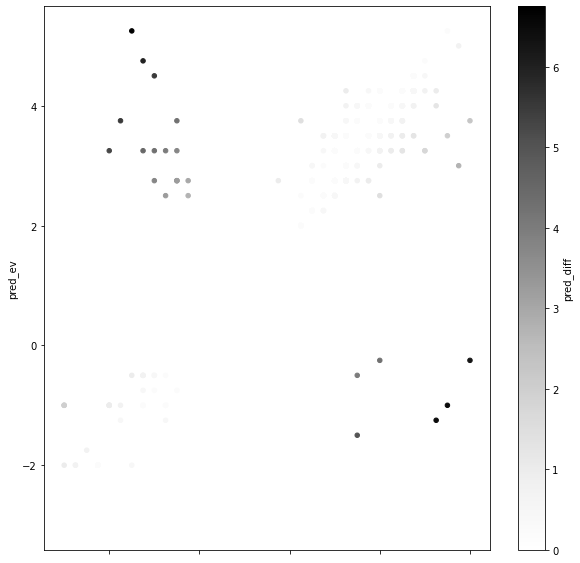

In [28]:
ev_df.plot.scatter(x="opt_ev", y="pred_ev", c="pred_diff")

In [31]:
from collections import defaultdict

opt_mse = defaultdict(dict)
for name in test_data.names:
    opt_ev = ev_df.loc[name, "pred_ev"]
    for metric in ["mse", "perceptual", "ssim"]:
        opt_mse["optimal_ev"][name] = opt_ev
        opt_mse[metric][name] = tdf.loc[name, (metric, opt_ev)]

opt_df = pd.DataFrame.from_dict(opt_mse)
opt_df

,optimal_ev,mse,perceptual,ssim
0006_20160721_170707_736,2.75,239.248197,0.045028,0.972916
0006_20160721_175239_909,3.75,97.861535,0.071783,0.957424
0006_20160721_181525_062,3.50,189.737775,0.054763,0.971599
0006_20160722_100126_028,3.50,83.307715,0.071208,0.969898
0006_20160722_100951_201,-0.25,116.511456,0.065129,0.967694
...,...,...,...,...
c483_20150901_173210_443,-0.75,212.416530,0.043381,0.959955
c483_20150901_194029_165,3.75,423.285114,0.070034,0.971709
c483_20150901_195108_436,3.25,436.567271,0.061960,0.977038
c483_20150901_214630_530,3.25,102.928818,0.058863,0.967441


In [32]:
updown_df = udf.groupby(["ev","metric"]).describe()
updown_df = updown_df.drop(columns="count", level=1)
updown_df.to_excel(ROOT_DIR/ "stats" / "updown_stats.xlsx")
updown_df

score                                                     \
                      mean          std         min          25%          50%   
ev metric                                                                       
1  mse         3667.828827  2875.598214  127.637031  1165.384213  3011.324919   
   perceptual     0.199319     0.133344    0.019178     0.087691     0.164521   
   ssim           0.658184     0.263431    0.042001     0.454258     0.711702   
2  mse         1913.439435  1752.948098   18.512766   368.594727  1434.538351   
   perceptual     0.120093     0.086524    0.013519     0.047255     0.097192   
   ssim           0.779540     0.205470    0.168938     0.649009     0.845653   
3  mse          758.367231   674.935995   35.842415   208.181011   547.666911   
   perceptual     0.075610     0.033702    0.024298     0.051895     0.067717   
   ssim           0.886411     0.110472    0.397654     0.846190     0.930000   
4  mse          414.698278   351.490504   25.903752   188.915423   309.936606   
   perceptual     0.067256     0.027250    0.013414     0.046024     0.065207   
   ssim           0.941384     0.030754    0.739949     0.929764     0.948539   
5  mse          834.221764   894.687043   29.791009   240.112536   474.606877   
   perceptual     0.093329     0.042967    0.004267     0.065400     0.092140   
   ssim           0.918467     0.048767    0.695179     0.894218     0.930918   

                                          
                       75%           max  
ev metric                                 
1  mse         5662.979398  12895.668152  
   perceptual     0.283455      0.624829  
   ssim           0.901722      0.988828  
2  mse         3085.278274   8210.740468  
   perceptual     0.169696      0.415442  
   ssim           0.955996      0.991971  
3  mse         1159.482411   3499.517900  
   perceptual     0.087874      0.231904  
   ssim           0.966626      0.990467  
4  mse          491.234934   2305.182954  
   perceptual     0.083956      0.164758  
   ssim           0.961611      0.988009  
5  mse         1092.765713   6928.573561  
   perceptual     0.122558      0.226806  
   ssim           0.955043      0.987636

In [33]:
flat_test_df = (
        tdf.unstack()
        .reset_index()
        .rename(columns={'level_2':"name", 0: "score"})
        .set_index("name")
    )
fixed_choice_stats = flat_test_df\
                    .groupby(["ev", "metric"])\
                    .describe()\
                    .drop(columns="count", level=1)\
                    .rename({"score": ""},level=1)
fixed_choice_stats.columns = [c[1] for c in fixed_choice_stats.columns]
fixed_choice_stats.to_excel(ROOT_DIR/"stats"/"fixed_choice_stats.xlsx")
fixed_choice_stats

mean          std        min          25%  \
ev    metric                                                         
-3.00 mse         5546.876453  3515.658809  44.354648  2641.700574   
      perceptual     0.267409     0.158623   0.026441     0.135397   
      ssim           0.551932     0.270077   0.016159     0.327673   
-2.75 mse         5600.739161  3539.296173  46.405561  2661.763110   
      perceptual     0.268712     0.159446   0.026146     0.136786   
...                       ...          ...        ...          ...   
 5.75 perceptual     0.132938     0.044652   0.027574     0.102225   
      ssim           0.869953     0.055845   0.622430     0.845880   
 6.00 mse         1593.932492  1178.252944  53.313284   712.422495   
      perceptual     0.146320     0.047876   0.029235     0.111386   
      ssim           0.848455     0.066321   0.614191     0.815665   

                          50%          75%           max  
ev    metric                                              
-3.00 mse         5185.539042  8376.264259  15497.940520  
      perceptual     0.237436     0.374124      0.734377  
      ssim           0.572024     0.786507      0.990503  
-2.75 mse         5211.228940  8482.238222  15592.416706  
      perceptual     0.239861     0.376186      0.734251  
...                       ...          ...           ...  
 5.75 perceptual     0.132960     0.163207      0.286091  
      ssim           0.875525     0.904473      0.986260  
 6.00 mse         1227.735534  2103.988670   8843.609691  
      perceptual     0.144558     0.178133      0.330502  
      ssim           0.850807     0.893161      0.986260  

[108 rows x 7 columns]

In [57]:
td_df = tdf.stack().reset_index().rename(columns={"level_0":"name"}).set_index("name")
td_df["rmse"] = td_df['mse'].transform(np.sqrt)
td_df = td_df.melt(
        value_vars=["mse", "perceptual", "ssim", "rmse"],
        id_vars=["ev"],
        ignore_index=False
    )
fixed_choice_stats = td_df.groupby(["ev","metric"]).describe().drop(columns="count",level=1)
fixed_choice_stats.columns = [c[1] for c in fixed_choice_stats.columns]
fixed_choice_stats.to_excel(ROOT_DIR/"stats"/"fixed_choice_stats.xlsx")
fixed_choice_stats

mean          std        min          25%  \
ev    metric                                                         
-3.00 mse         5546.876453  3515.658809  44.354648  2641.700574   
      perceptual     0.267409     0.158623   0.026441     0.135397   
      rmse          69.716594    26.218743   6.659929    51.397452   
      ssim           0.551932     0.270077   0.016159     0.327673   
-2.75 mse         5600.739161  3539.296173  46.405561  2661.763110   
...                       ...          ...        ...          ...   
 5.75 ssim           0.869953     0.055845   0.622430     0.845880   
 6.00 mse         1593.932492  1178.252944  53.313284   712.422495   
      perceptual     0.146320     0.047876   0.029235     0.111386   
      rmse          37.546608    13.580850   7.301595    26.691241   
      ssim           0.848455     0.066321   0.614191     0.815665   

                          50%          75%           max  
ev    metric                                              
-3.00 mse         5185.539042  8376.264259  15497.940520  
      perceptual     0.237436     0.374124      0.734377  
      rmse          72.010577    91.521823    124.490725  
      ssim           0.572024     0.786507      0.990503  
-2.75 mse         5211.228940  8482.238222  15592.416706  
...                       ...          ...           ...  
 5.75 ssim           0.875525     0.904473      0.986260  
 6.00 mse         1227.735534  2103.988670   8843.609691  
      perceptual     0.144558     0.178133      0.330502  
      rmse          35.039054    45.869222     94.040468  
      ssim           0.850807     0.893161      0.986260  

[144 rows x 7 columns]

In [200]:
from pprint import pprint
from collections import defaultdict
grouped = td_df.groupby("metric")
gnames = ["mse", "ssim", "perceptual", "rmse"]
pred_evs= []
ei = ev_df.reset_index()
for g, gname in zip([grouped.get_group(gname) for gname in gnames], gnames):
    gi = g.reset_index()
    for row in ei.itertuples():
        pred_ev = row.pred_ev
        val = gi[(gi["name"] == row.name) & (gi["ev"] == pred_ev)]["value"].iloc[0]
        pred_evs.append((row.name, row.pred_ev, gname, val))


In [203]:
pred_df = pd.DataFrame.from_records(pred_evs, columns=["name", "ev", "metric", "value"],index="name")
# pred_df = pred_df.pivot(columns=["metric"])
pred_df.groupby(["ev","metric"]).describe()

value                                                  \
                 count        mean         std         min         25%   
ev    metric                                                             
-3.00 mse          1.0  214.788618         NaN  214.788618  214.788618   
      perceptual   1.0    0.055642         NaN    0.055642    0.055642   
      rmse         1.0   14.655668         NaN   14.655668   14.655668   
      ssim         1.0    0.976258         NaN    0.976258    0.976258   
-2.00 mse         11.0  253.036345  227.015845   65.702703  119.999267   
...                ...         ...         ...         ...         ...   
 5.00 ssim         1.0    0.871680         NaN    0.871680    0.871680   
 5.25 mse          2.0  976.390348  310.018770  757.173974  866.782161   
      perceptual   2.0    0.134711    0.012848    0.125626    0.130169   
      rmse         2.0   31.047170    4.992706   27.516794   29.281982   
      ssim         2.0    0.921089    0.003522    0.918598    0.919844   

                                                        
                         50%          75%          max  
ev    metric                                            
-3.00 mse         214.788618   214.788618   214.788618  
      perceptual    0.055642     0.055642     0.055642  
      rmse         14.655668    14.655668    14.655668  
      ssim          0.976258     0.976258     0.976258  
-2.00 mse         200.869410   278.874786   886.655614  
...                      ...          ...          ...  
 5.00 ssim          0.871680     0.871680     0.871680  
 5.25 mse         976.390348  1085.998536  1195.606723  
      perceptual    0.134711     0.139253     0.143796  
      rmse         31.047170    32.812358    34.577547  
      ssim          0.921089     0.922334     0.923579  

[92 rows x 8 columns]

In [199]:
td_df

,ev,metric,value
name,,,
0006_20160721_170707_736,-3.00,mse,1564.444742
0006_20160721_170707_736,-2.75,mse,1620.747432
0006_20160721_170707_736,-2.50,mse,1666.827206
0006_20160721_170707_736,-2.25,mse,1694.827552
0006_20160721_170707_736,-2.00,mse,1703.434451
...,...,...,...
c483_20150901_221141_886,5.00,rmse,25.383430
c483_20150901_221141_886,5.25,rmse,30.030187
c483_20150901_221141_886,5.50,rmse,35.037386


metric
mse           AxesSubplot(0.125,0.125;0.775x0.755)
perceptual    AxesSubplot(0.125,0.125;0.775x0.755)
rmse          AxesSubplot(0.125,0.125;0.775x0.755)
ssim          AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

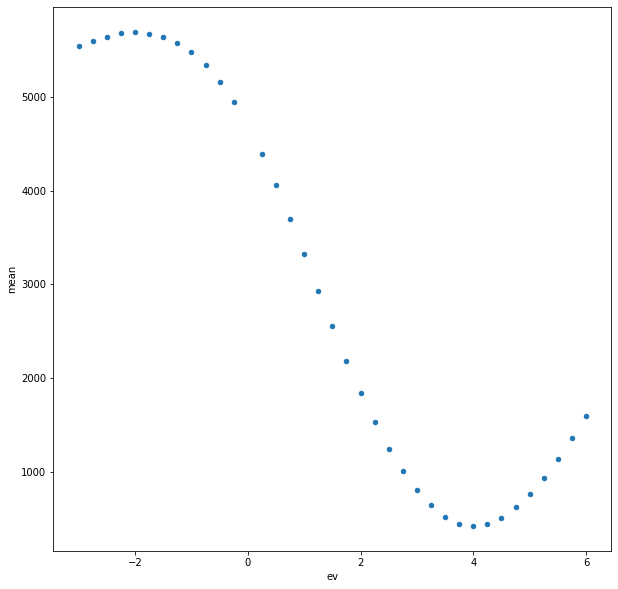

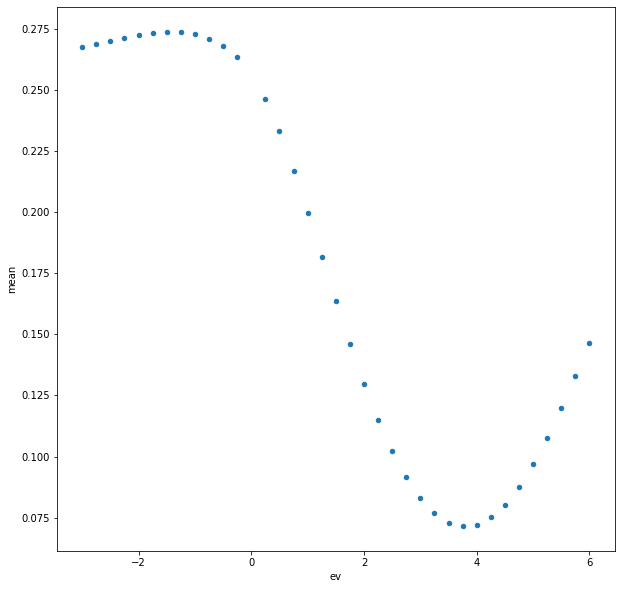

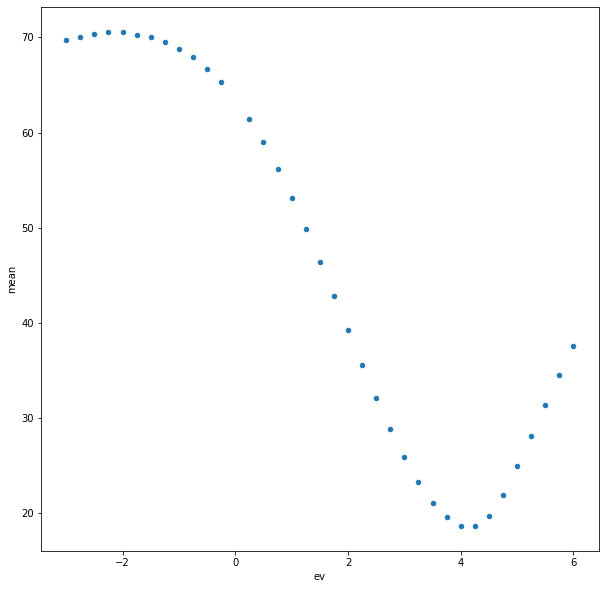

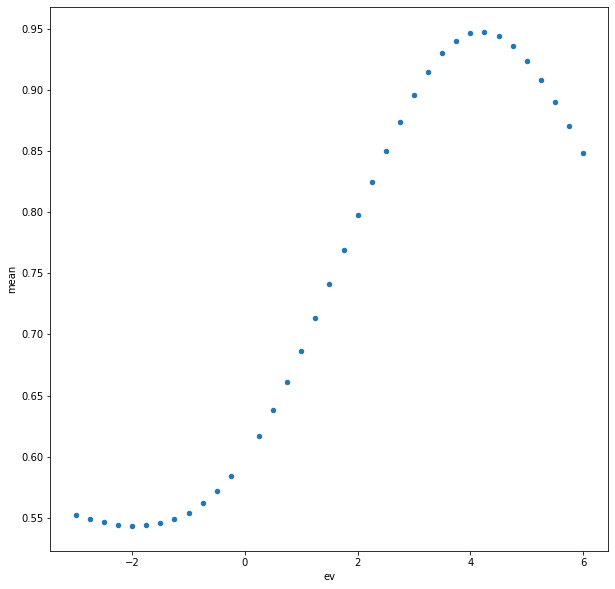

In [58]:
fixed_choice_stats.reset_index().groupby('metric').plot.scatter(x="ev",y="mean")
    

In [ ]:
t_mse = tdf["mse"]
for i in range(1,5):
    if i < 4:
        opt_df[f"ev{-i}_mse"] = t_mse[-i]
    opt_df[f"ev+{i}_mse"] = t_mse[i]
opt_df

In [ ]:
from pandas.plotting import scatter_matrix
scatter_matrix(opt_df, alpha=0.2, diagonal="kde")

In [ ]:
updown_pct = pd.DataFrame()
for i in range(1,5):
#     updown_pct[f"EV -{i} Difference"] = 
#     updown_pct[f"EV +{i} Difference"] = 
    if i < 4:
        print(f'-{i}:  {opt_df[["mse", f"ev-{i}_mse"]].pct_change(axis="columns").mean().iloc[1]}')
    print(f'+{i}: {opt_df[["mse", f"ev+{i}_mse"]].pct_change(axis="columns").mean().iloc[1]}')

# updown_pct

In [ ]:
opt_df[["mse", "ev-1_mse"]].pct_change(axis="columns").mean()

In [ ]:

for i in range(1,5):
    print(i, opt_df[["mse", f"updown_mse_{i}"]].pct_change(axis="columns").mean().iloc[1])


In [ ]:
opt_df.mean()